# Projekt Bild- und Signalverarbeitung - Kamerakalibrierung und Vermessung von Paketen

Im Kontext des Moduls Bild- und Signalverarbeitung folgt die Studienarbeit von Adrian Schiel (7022935) und Mirko Labitzke (7021691). Betreut wird diese Arbeit von Prof. Koch <br>
Die Aufgabenstellung ist dabei selber eine Kamera in Form einer Webcam oder Ähnlichem zu kalibrieren und mithilfe der Kalibrierung Pakete zu vermessen.

### Zielsetzung

Im Rahmen der Studienarbeit ist das Ziel eine Webcam, in unserem Fall eine "Logitech c925e" 1080p ohne Auto-Fokus, zu kalibrieren. Dazu werden innerhalb einer Fotobox verschiedene Bilder von Schachbrettmustern gemacht und anschließend werden diese mithilfe von Algorithmen aus der OpenCV Bibliothek genutzt, um den Fehler und andere Werte der Kamera zu ermitteln. Die Fotobox wird verwendet, um besonders gute Bilder mit kontrollierten Lichtverhältnissen und wenig Einfluss von Außen machen zu können. <br>
Mithilfe der Kamerakalibrierung sollen verschieden große und farbige Pakete erkannt und vermessen werden. Die Bilder der Pakete werden ebenfalls unter genau den gleichen Bedingungen gemacht. Bei der vermessung der Pakete wird sich erst auf die 2D Vermessung von Höhe und Breite konzentriert. Die 3D Vermessung von Höhe, Breite und Tiefe wäre der Schritt, der darauf folgt, wenn die 2D Vermessung gut klappt.  <br>
Die Zielsetzung allgemein ist bei dem Projekt einfach zu definieren:
#### Es soll eine möglichst gute Kamerakalibrierung gefunden werden, mit welcher die unterschiedlichen Pakete möglichst genau Vermessen werden können!

## Importieren der nötigen Pakete und Bibliotheken

Mit simplen import Befehlen, werden am Anfang alle benötigten Pakete und Bibliotheken importiert. <br>
Dabei ist es wichtig, dass das Paket opencv-python erfolgreich auf dem Computer installiert ist. Bei Problemen ist eine neuinstallation mit pip vielleicht notwendig. <br>
- pip uninstall opencv-python | pip install opencv-python

In [273]:
import cv2 as cv
import numpy as np
import glob #gibt Dateipfade mit einer Musterübereinstimmung in einem Verzeichnis zurück.
import matplotlib.pyplot as plt
from skimage import io, color, filters, measure, morphology
import os

## Bilder erstellen, einlesen und anzeigen

### Kameraeinstellungen anpassen und Bilder machen - getImages()

In der Methode getImages() werden die nötigen Einstellungen für die Kamera vorgenommen. Dabei wird die Breite des Bildes auf 1920 Pixel und die Höhe auf 1080 Pixel eingestellt. Außerdem wird der Auto-Fokus und die Auto-Belichtung ausgeschaltet, damit diese keinen Einfluss auf die Bilder haben und eine Kalibrierung "per Hand" notwendig wird. <br>

Nachdem die Einstellungen vorgenommen werden, ist das Kamerabild in einem externen Fenster zu sehen und mithilfe von Drücken der 'S' taste, werden Bilder zur Kalibrierung gespeichern. Allgemein gilt, je mehr gute Bilder zur Kalibrierung zur Verfügung stehen, desto besser wird diese. Nach Drücken der 'ESC' Taste wird das externe Fenster geschlossen und die Kamera kann mithilfe der abgespeicherten Bilder kalibriert werden.

In [274]:
def getImages(pathname, displayImages=False):
    
    if not os.path.exists(pathname):
        os.makedirs(pathname)
        print(f"Der Ordner {pathname} wurde erstellt.")
    
    width = 1920
    height = 1080

    cap = cv.VideoCapture(0)

    # Setzen Sie die Auflösung der Videoerfassung
    cap.set(cv.CAP_PROP_FRAME_WIDTH, width)  # 3 entspricht CV_CAP_PROP_FRAME_WIDTH
    cap.set(cv.CAP_PROP_FRAME_HEIGHT, height)
    cap.set(cv.CAP_PROP_AUTOFOCUS,0)
    cap.set(cv.CAP_PROP_AUTO_EXPOSURE, 0)  # 4 entspricht CV_CAP_PROP_FRAME_HEIGHT
    # cap.set(cv.CAP_PROP_EXPOSURE, -6) #https://www.principiaprogramatica.com/2017/06/11/setting-manual-exposure-in-opencv/

    num = 0

    while cap.isOpened():
        success, img = cap.read()

        k = cv.waitKey(5)
        savepath = f'{pathname}/img{str(num)}.png'

        if k == 27:  # ESC Button
            break
        elif k == ord('s'):  # wait for 's' key to save and exit
            cv.imwrite(savepath, img)
            print(f"{savepath} saved!")
            num += 1
            if(displayImages):
                plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
                plt.title(f"Bild {num}")
                plt.axis('off')
                plt.show()
        # Anzeige des Live-Video-Feeds
        cv.imshow("Live-Video-Feed", img)

    # Freigabe und Zerstörung aller Fenster vor der Beendigung
    cap.release()


Hier wird die Methode getImages() aufgerufen, um sich neue Bilder für die Kalibrierung zu erstellen. Die Methode ist auskommentiert, da Die Bilder theoretisch nur einmal erstellt werden müssen, um damit zu arbeiten, falls neue Bilder benötigt werden, kann diese zeile jeder Zeit wieder in Betrieb genommen werden.

In [275]:
# getImages('./test/')

### Kalibrierungs-Bilder aus dem Ordner anzeigen - showImagesFromFolder()

In der Methode showImagesFromFolder() werden Bilder aus einem übergebenen Ordner ausgegeben. Dabei wird ebenfalls geprüft, ob der Ordner Leer ist und falls dies der Fall ist eine Fehler-Meldung ausgegeben.

In [276]:
def showImagesFromFolder(pathname):
    # Überprüfen, ob der Ordner existiert
    if not os.path.exists(pathname):
        print(f"Der Ordner {pathname} existiert nicht.")
        return

    # Liste der Bildpfade im Ordner erhalten
    images = glob.glob(f'{pathname}/*.png')

    if not images:
        print("Es wurden keine Bilder im angegebenen Ordner gefunden.")
        return

    # Bilder nebeneinander anzeigen
    num_images = len(images)
    num_rows = (num_images + 2) // 3  # Aufgerundete Division
    num_cols = min(num_images, 3)

    plt.figure(figsize=(16, 3 * num_rows))
    for i, img_path in enumerate(images, start=1):
        img = cv.imread(img_path)
        img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)
        plt.subplot(num_rows, num_cols, i)
        plt.imshow(img_rgb)
        plt.title(img_path)
        plt.axis('off')
    plt.tight_layout()

    plt.show()


Aufrufen der Methode showImagesFromFolder(), um die vorher erstellten Bilder zur Kalibrierung anzeigen zu lassen.

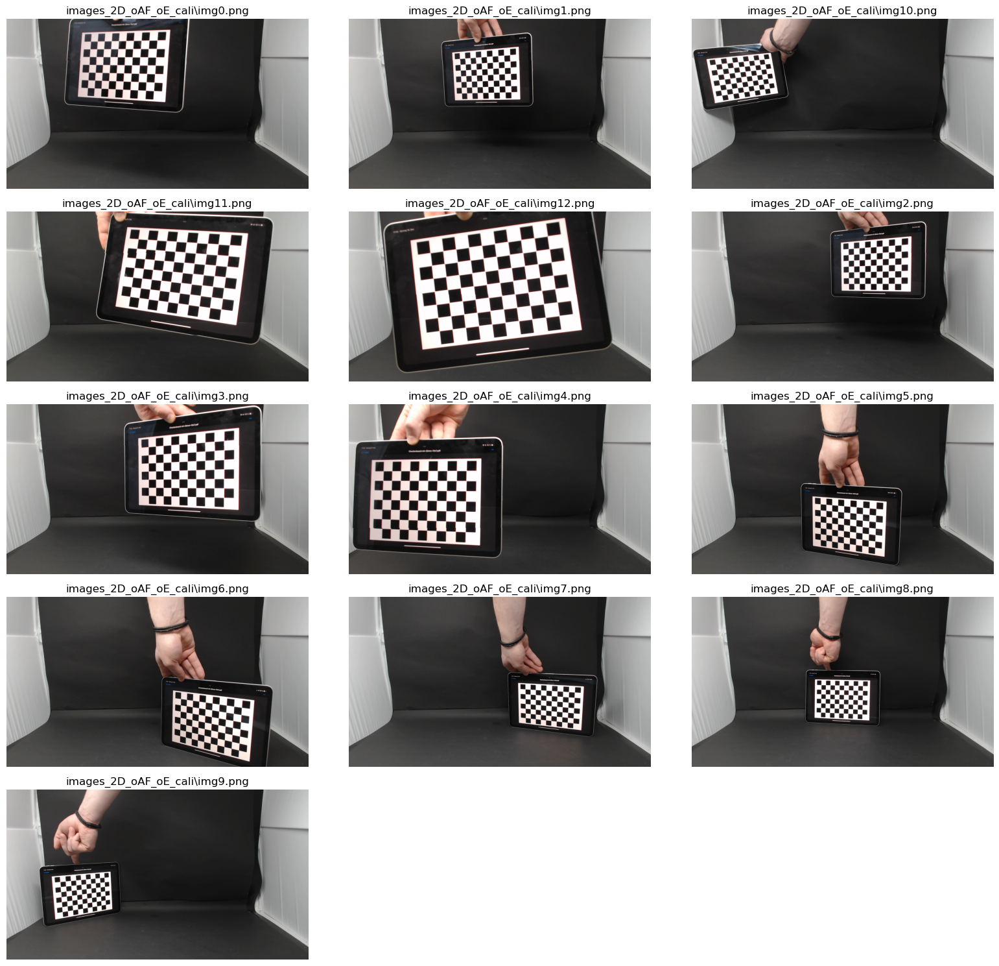

In [277]:
showImagesFromFolder("images_2D_oAF_oE_cali")

Aufrufen der Methode showImagesFromFolder(), um die Bilder der verschiedenen Pakete, welche vermessen werden sollen anzuezeigen.

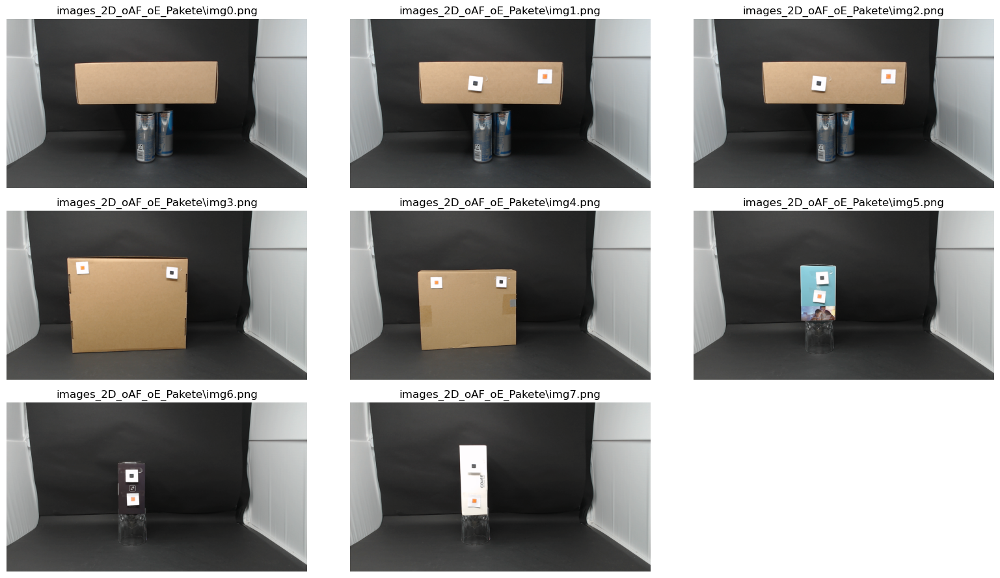

In [278]:
showImagesFromFolder('images_2D_oAF_oE_Pakete')

## Kamera Kallibrieren

Im Folgendem wird schrittweise die kamera kalibriert. 



### 1. Das Schachfeld suchen

Als ersten Schritt werden auf dem jeweiligen Bild zur Kalibriereung ein 10x7 großes Schachfeld gesucht, in diesem wird jede Ecke gesucht und mitsamt seiner Koordinaten zurückgegeben.

In [279]:
def find_chessboard_corners(img, chessboard_size):
    gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
    ret, corners = cv.findChessboardCorners(gray, chessboard_size, None)
    return ret, corners

### 2. Verfeinerungen der Schachbrettecken

Die Funktion refine_corners() verfeinert die ursprünglichen Ecken eines Bildes auf Subpixel-Ebene, wodurch eine genauere Positionierung der Ecken erreicht wird.

In [280]:
def refine_corners(img, corners, criteria):
    gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
    corners_refined = cv.cornerSubPix(gray, corners, (11, 11), (-1, -1), criteria)
    return corners_refined

### 3. Vorbereitung der 3D-Koordinaten der Eckpunkte

Die Funktion prepare_object_points() bereitet die 3D-Koordinaten der Eckpunkte des Schachbretts vor. Diese vorbereiteten Objektpunkte werden verwendet, um die intrinsischen und extrinsischen Parameter der Kamera zu ermitteln.

In [281]:
def prepare_object_points(chessboard_size=(10,7)):
    objp = np.zeros((chessboard_size[0] * chessboard_size[1], 3), np.float32)
    objp[:,:2] = np.mgrid[0:chessboard_size[0],0:chessboard_size[1]].T.reshape(-1,2)

    size_of_chessboard_squares_mm = 20
    objp = objp * size_of_chessboard_squares_mm
    return objp

### 4. Durchiterieren und Aufrufen der Methoden

In der Methode collect_object_and:image_points() wird durch einen Ordner mit Bildern iteriert. Dabei werden bei jedem einzlenen Bild die Methoden aus Schritt 1 und 2 aufgerufen, dabei werden Die Punkte auf dem Schachfeld ermittelt und übergeben. 

In [1]:

def collect_object_and_image_points(pathname, chessboard_size, objp, draw=True):
    criteria = (cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER, 30, 0.001)
    objpoints = [] # 3d point in real world space
    imgpoints = [] # 2d points in image plane.
    
    
    images = glob.glob(f'{pathname}/*.png')
    
    num_images = len(images)
    num_rows = (num_images + 2) // 3  # Aufgerundete Division
    num_cols = min(num_images, 3)

    if draw:
        fig, axes = plt.subplots(num_rows, num_cols,figsize=(16, 3 * num_rows), constrained_layout=True)
    
    
    for i, image in enumerate(images):
        img = cv.imread(image)
        ret, corners = find_chessboard_corners(img, chessboard_size)

        if ret:
            corners_refined = refine_corners(img, corners, criteria)
            objpoints.append(objp)
            imgpoints.append(corners_refined)
            if draw:
                cv.drawChessboardCorners(img, chessboard_size, corners_refined, ret)
                axes[i // num_cols, i % num_cols].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
                axes[i // num_cols, i % num_cols].set_title(image)
                axes[i // num_cols, i % num_cols].axis('off')
    if draw:    
        for i in range(num_images, num_rows * num_cols):
            row_idx = i // num_cols
            col_idx = i % num_cols
            axes[row_idx, col_idx].axis('off')
        plt.tight_layout()
        plt.show()
    
    
    return objpoints, imgpoints
    


### 5. Kalibrieren der Kamera und Berechnung der Verzerrungskorrektur

Die Methode calibrate() ermittelt mittels der der vorher geschriebenen Methoden sowohl neue CameraMatrixs, mithilfe der verschiedenen Bildern mit Schachbrättern, als auch den Fehler, der durch die Kamera erzeugt wird. Der Fehler der Kamera wird anschließend ausgegeben und die Methode ermittelt die notwendige Verzerrungskorrektur, welche am Ende übergeben wird.

In [2]:
def calibrate(pathname, image_path, chessboard_size=(10,7),frame_size=(1920,1080), draw=True, print_error=True):
    objp = prepare_object_points(chessboard_size)

    objpoints, imgpoints = collect_object_and_image_points(pathname, chessboard_size, objp, draw=draw)
    
    ret, camera_matrix, dist_coeff, rvecs, tvecs = cv.calibrateCamera(objpoints, imgpoints, frame_size, None, None)
    
    img = cv.imread(image_path)
    h,  w = img.shape[:2]
    newCameraMatrix, roi = cv.getOptimalNewCameraMatrix(camera_matrix, dist_coeff, (w,h), 1, (w,h))

    # Undistort -  Verzerrungskorrektur
    dst = cv.undistort(img, camera_matrix, dist_coeff, None, newCameraMatrix)

    # crop the image
    x, y, w, h = roi
    dst = dst[y:y+h, x:x+w]
    
    if print_error:
        mean_error = 0

        for i in range(len(objpoints)):
            imgpoints2, _ = cv.projectPoints(objpoints[i], rvecs[i], tvecs[i], camera_matrix, dist_coeff)
            error = cv.norm(imgpoints[i], imgpoints2, cv.NORM_L2)/len(imgpoints2)
            mean_error += error

        print("total error: {}".format(mean_error/len(objpoints))) 
    
    return dst   



Aufruf der Methode calibrate() und dadurch Anpassungen und Ausgabe von Bild-7.

total error: 0.04193406354657396
(1062, 1909, 3)


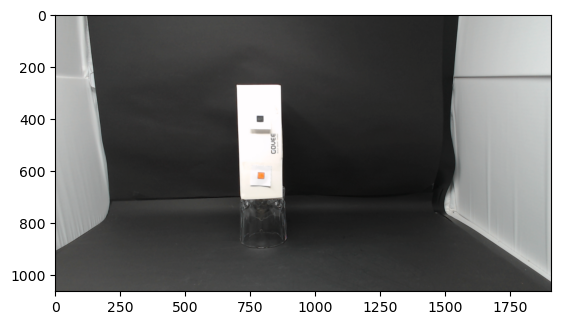

In [284]:
calibrated_img = calibrate(pathname='images_2D_oAF_oE_cali', image_path='images_2D_oAF_oE_Pakete/img7.png', draw=False)

print(calibrated_img.shape)
plt.imshow(cv.cvtColor(calibrated_img, cv.COLOR_BGR2RGB))
plt.show()

## Finden und Ausmessen des Paketes auf dem Bild

Der nächste Schritt ist, das Paket auf dem Bild zu finden und die Maße in Pixeln zu ermitteln.

### 1. Vorbereitung des Bildes

Die Methode prepare_Image() bereitet das Bild auf weitere Algorithmen vor, indem links und rechts jeweils der weiße Teil der Fotobox enfernt wird. Anschließend wird neben dem originallem Bild ebenfalls das Bild nur mit Grauwerten übergeben.

In [285]:
def prepare_Image(image, margin_right:int, margin_left:int, draw=True):
    image = image[:, margin_left:margin_right]

    gray_image = color.rgb2gray(image)

    image = cv.cvtColor(image, cv.COLOR_BGR2RGB)

    if draw:
        plt.imshow(image)
        plt.show()
        plt.imshow(gray_image, cmap='gray')
        plt.show()

    return gray_image, image

### 2. Anwenden des Otsu-Filters

In get_Binary_Image_2D() wird ein Bild übergeben, auf dieses Bild wird der Otsu_Filter angewandt. Dieser Filter teilt das Bild ein genau 2 Ebenen, Hintergrund(0) und Vordergrund(1).

In [286]:
def get_Binary_Image_2D(image, draw=True):
    thresh = filters.threshold_otsu(image)
    binary_image = image > thresh

    if draw:
        plt.imshow(binary_image, cmap='gray')
        plt.show()
    return binary_image

In [287]:
def get_Largest_Region_2D(binary_image):
    labeled_image = measure.label(binary_image)

    regions = measure.regionprops(labeled_image)
    
    print(f'Found {len(regions)} Regions')

    largest_region = max(regions, key=lambda region: region.area)
    
    return largest_region

In [288]:
def get_Edge_Lenght_2D(prepared_image, draw_Binary=True, draw_Final=True):
    binary_image = get_Binary_Image_2D(prepared_image, draw=draw_Binary)

    largest_region = get_Largest_Region_2D(binary_image)

    minr, minc, maxr, maxc = largest_region.bbox

    width = maxc - minc
    height = maxr - minr
    
    print(f'Kantenlänge (Breite): {width} Pixel')
    print(f'Kantenlänge (Höhe): {height} Pixel')
    
    if draw_Final:
        fig, ax = plt.subplots()
        ax.imshow(prepared_image, cmap='gray')
        rect = plt.Rectangle((minc, minr), maxc - minc, maxr - minr, fill=False, edgecolor='red', linewidth=2)
        ax.add_patch(rect)
        plt.show()

    return width, height


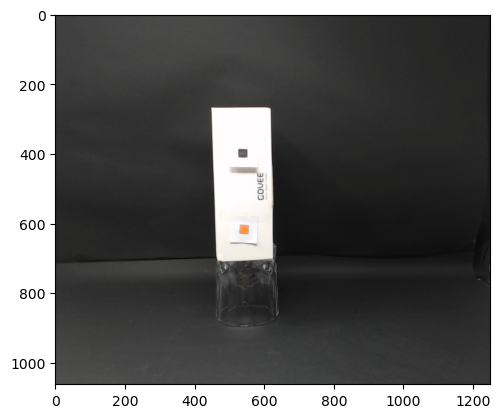

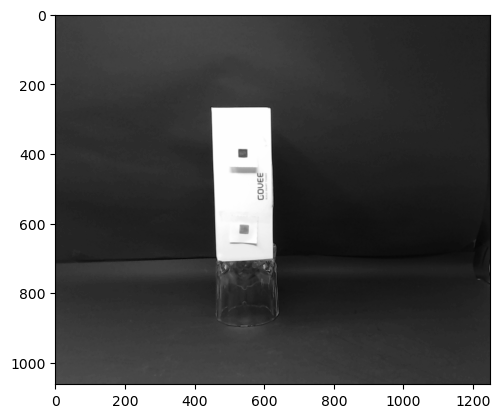

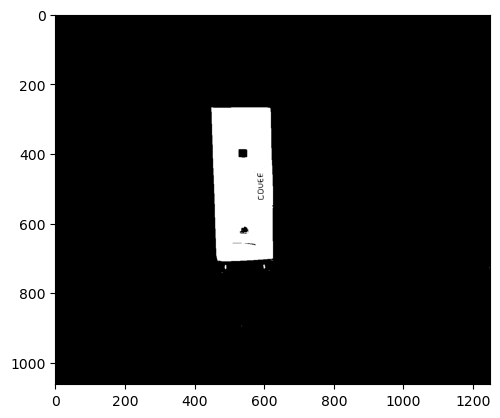

Found 12 Regions
Kantenlänge (Breite): 178 Pixel
Kantenlänge (Höhe): 442 Pixel


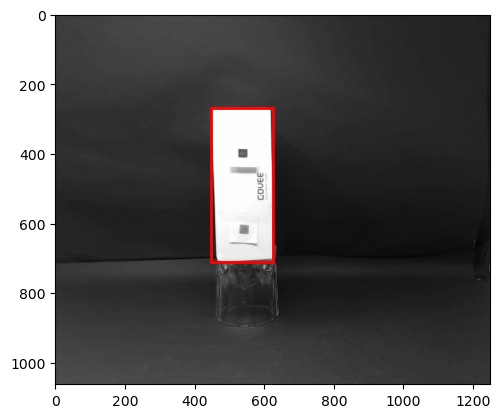

In [289]:

prepared_image_gray, prepared_image_rgb = prepare_Image(calibrated_img, margin_right = -410, margin_left = 250, draw=True)
width, height = get_Edge_Lenght_2D(prepared_image_gray, draw_Final=True, draw_Binary=True)

In [290]:
def get_Orange_Square_Lenght_2D(prepared_image, draw_binary=True, draw_final=True):
    
    plt.imshow(prepared_image)
    plt.show()

    # Definieren Sie den Farbbereich für Orange im RGB-Farbraum
    lower_orange = np.array([200, 100, 0], dtype=np.uint8)
    upper_orange = np.array([255, 200, 100], dtype=np.uint8)

    # Erstellen Sie ein binäres Bild, das den orangefarbenen Bereich enthält
    binary_image = cv.inRange(prepared_image, lower_orange, upper_orange)



    if draw_binary:
        plt.imshow(binary_image, cmap='gray')
        plt.show()
    
    largest_region = get_Largest_Region_2D(binary_image)

    minr, minc, maxr, maxc = largest_region.bbox

    width = maxc - minc
    height = maxr - minr

    len_mean = int(round((width + height) / 2, 0)) 
    
    print(f'Kantenlänge (Mean): {len_mean} Pixel')
    
    if draw_final:
        fig, ax = plt.subplots()
        ax.imshow(prepared_image, cmap='gray')
        rect = plt.Rectangle((minc, minr), len_mean, len_mean, fill=False, edgecolor='red', linewidth=2)
        ax.add_patch(rect)
        plt.show()

    return len_mean

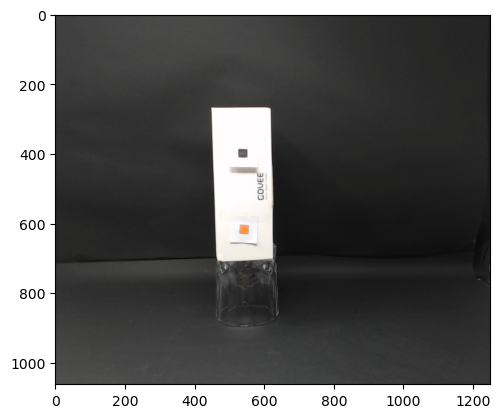

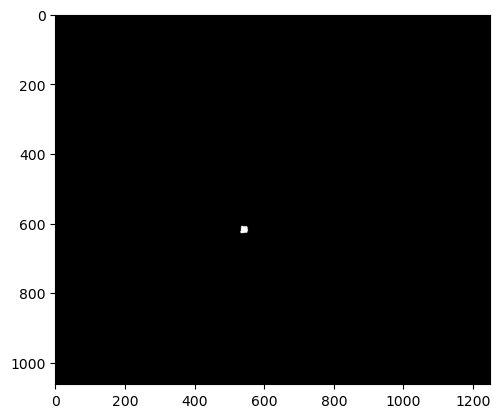

Found 1 Regions
Kantenlänge (Mean): 22 Pixel


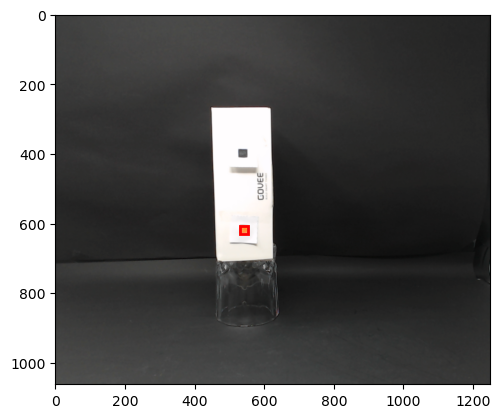

In [291]:
len_1cm_mean = get_Orange_Square_Lenght_2D(prepared_image_rgb)

In [292]:
 
width_cm = width / len_1cm_mean
height_cm = height / len_1cm_mean

# Drucken Sie die Ergebnisse
print(f'Kantenlänge (Breite): {width_cm:.2f} cm')
print(f'Kantenlänge (Höhe): {height_cm:.2f} cm')


Kantenlänge (Breite): 8.09 cm
Kantenlänge (Höhe): 20.09 cm


# Kalibrate 3D

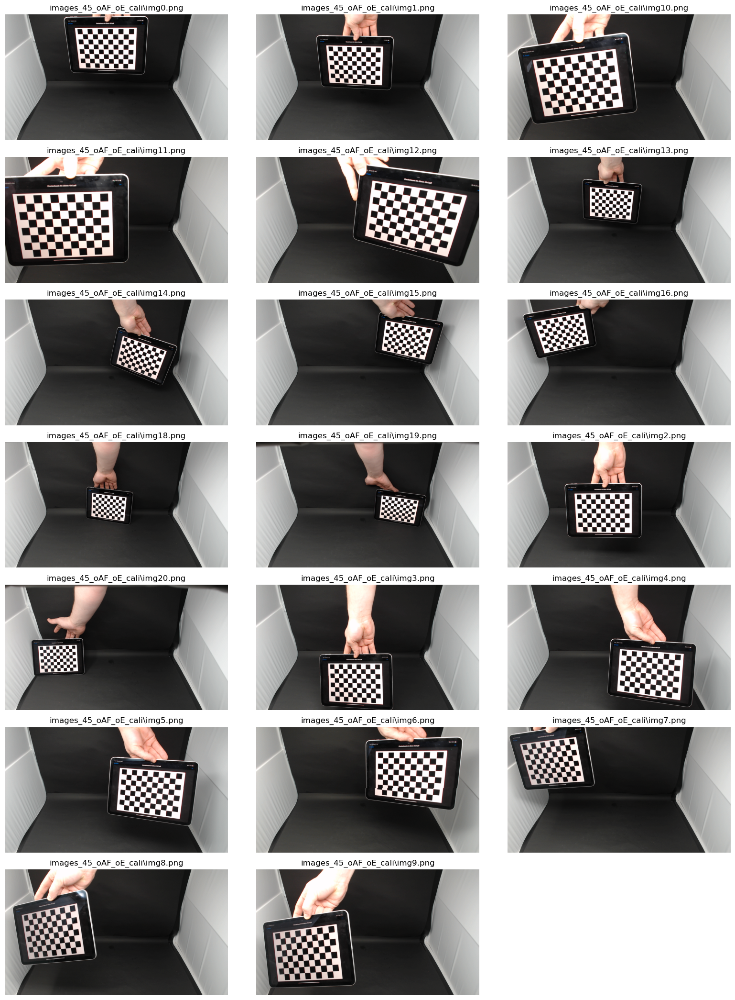

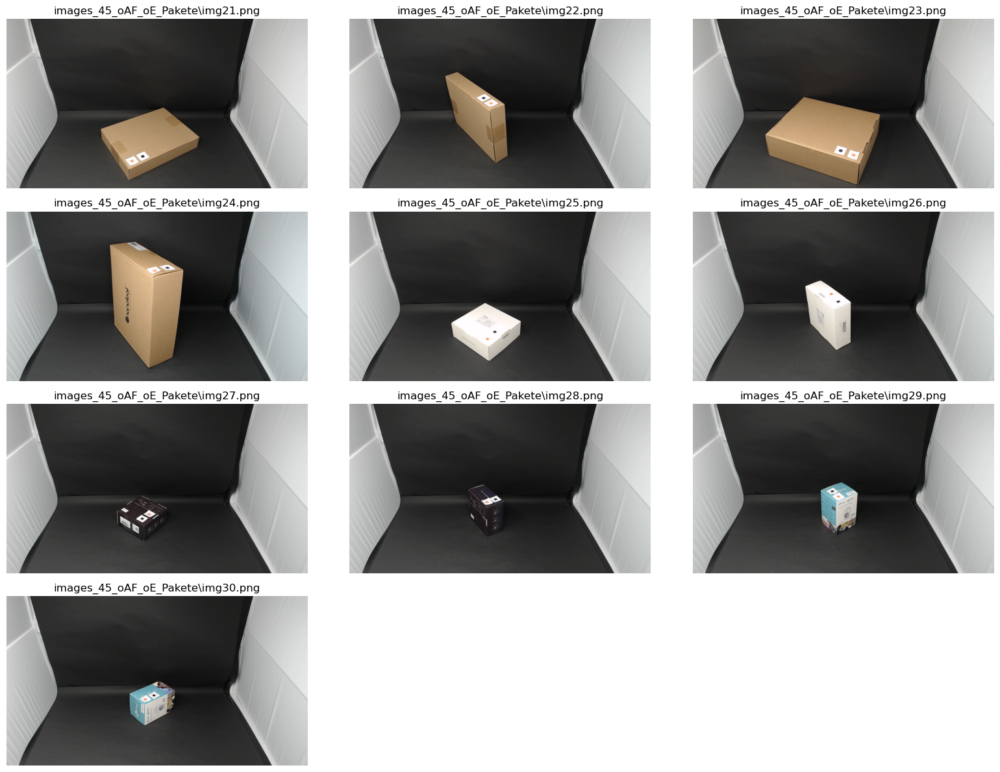

total error: 0.032820495968905676
(1068, 1915, 3)


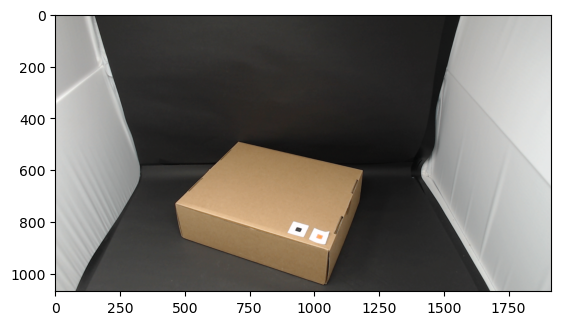

In [293]:
showImagesFromFolder('images_45_oAF_oE_cali')
showImagesFromFolder('images_45_oAF_oE_Pakete')

calibrated_img_3D = calibrate(pathname='images_45_oAF_oE_cali', image_path='images_45_oAF_oE_Pakete/img23.png', draw=False)

#img25 originale Maße 17x17x6
#img23 originale Maße 25x31x9.5
print(calibrated_img_3D.shape)
plt.imshow(cv.cvtColor(calibrated_img_3D, cv.COLOR_BGR2RGB))
plt.show()

In [294]:
def find_edges_3D(gray_image, draw=True):
    edges = cv.Canny(gray_image, 50, 150)

    if draw:
        plt.imshow(edges)
        plt.show()

    return edges

In [295]:
def find_largest_Contour_3D(edges):
    # Finde Konturen im Bild
    contours, _ = cv.findContours(edges, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    
    # Sortiere die Konturen nach der Fläche
    contours = sorted(contours, key=cv.contourArea, reverse=True)
    
    # Wähle die größte Kontur aus
    largest_contour = contours[0]
    return largest_contour

In [296]:
def approximate_contour_3D(largest_contour):
    epsilon = 0.01 * cv.arcLength(largest_contour, True)
    approx = cv.approxPolyDP(largest_contour, epsilon, True)

    # Sortiere die approximierten Punkte im Uhrzeigersinn
    center = tuple(np.mean(approx, axis=0)[0])
    approx = sorted(approx, key=lambda point: np.arctan2(point[0][1] - center[1], point[0][0] - center[0]))
    return approx

In [297]:
def get_Edge_Lenght_3D(prepared_Image_Gray, prepared_Image_RGB, draw=True):
    edges = find_edges_3D(prepared_Image_Gray, draw=draw)
    largest_contour = find_largest_Contour_3D(edges)

    approx = approximate_contour_3D(largest_contour)

    colors = [np.array([0, 0, 255]), np.array([0, 255, 0]), np.array([255, 0, 0]),
              np.array([255, 255, 0]), np.array([0, 255, 255]), np.array([255, 0, 255])]
    
    lenghts = dict()

    if draw:
        plt.figure(figsize=(10, 10))

        # Zeichne das Bild
        plt.imshow(cv.cvtColor(prepared_Image_RGB, cv.COLOR_BGR2RGB))

        for i in range(len(approx)):
            start_point = approx[i][0]
            end_point = approx[(i + 1) % len(approx)][0]
            color = colors[i]

            # Berechnung der Länge jeder Kante
            length_pixels = int(np.sqrt((end_point[0] - start_point[0])**2 + (end_point[1] - start_point[1])**2))
            print(f"Kante {i + 1}: Länge = {length_pixels} Pixel, Farbe = {color}")
            lenghts[i] = length_pixels

            # Linien auf das Bild zeichnen
            plt.plot([start_point[0], end_point[0]], [start_point[1], end_point[1]], linewidth=2, color=color/255)

        plt.title('Image with Smoothed Lines')
        plt.axis('off')  # Achsen verstecken
        plt.show()
    
    height_mean = int(round((lenghts[2] + lenghts[5]) / 2, 0))
    length_mean = int(round((lenghts[1] + lenghts[4]) / 2, 0))
    depth_mean = int(round((lenghts[0] + lenghts[3]) / 2, 0))
    return height_mean, length_mean, depth_mean

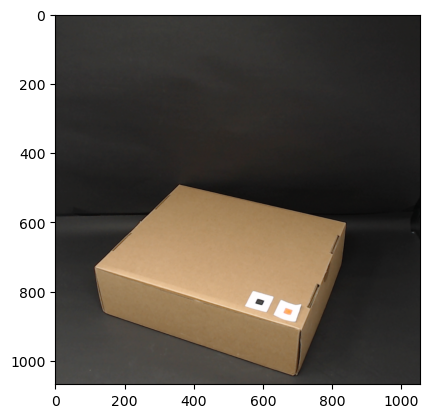

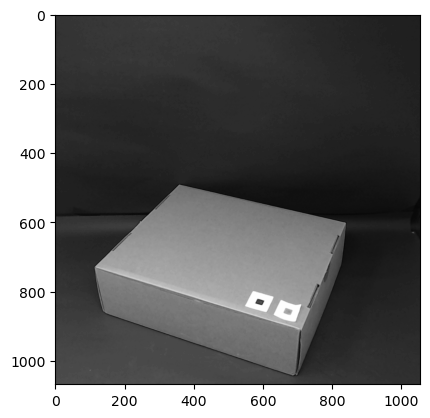

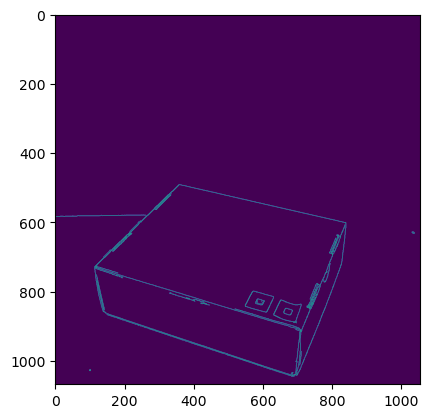

Kante 1: Länge = 339 Pixel, Farbe = [  0   0 255]
Kante 2: Länge = 493 Pixel, Farbe = [  0 255   0]
Kante 3: Länge = 121 Pixel, Farbe = [255   0   0]
Kante 4: Länge = 343 Pixel, Farbe = [255 255   0]
Kante 5: Länge = 579 Pixel, Farbe = [  0 255 255]
Kante 6: Länge = 137 Pixel, Farbe = [255   0 255]


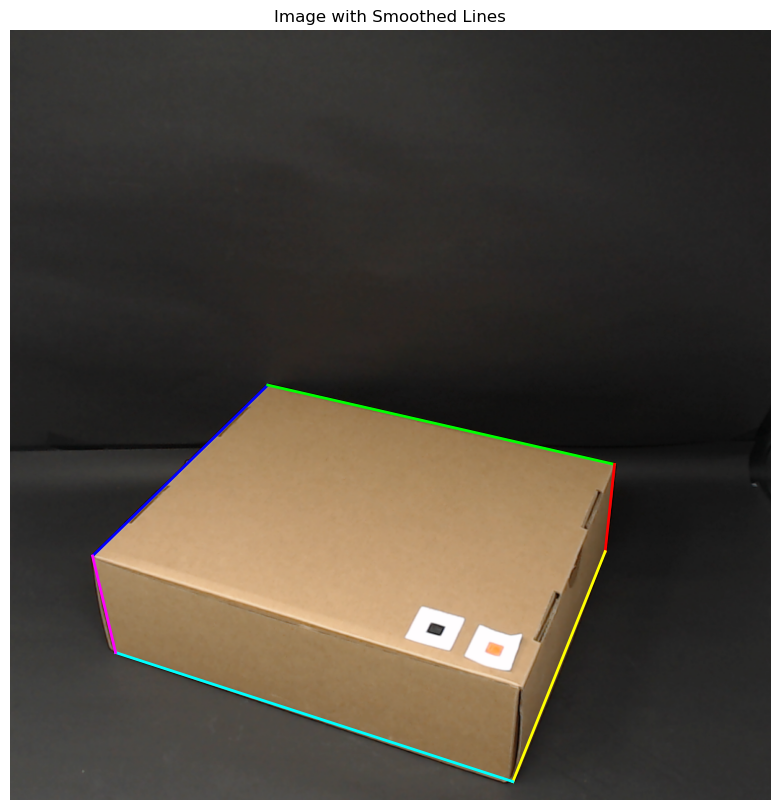

129 536 341


In [298]:
prepared_image_gray_3D, prepared_image_rgb_3D = prepare_Image(calibrated_img_3D, margin_left=350, margin_right=-510, draw=True)

prepared_image_gray_3D_Edge = cv.cvtColor(prepared_image_rgb_3D, cv.COLOR_BGR2GRAY)

prepared_image_rgb_3D_Edge = cv.cvtColor(prepared_image_rgb_3D, cv.COLOR_BGR2RGB)

height_mean, length_mean, depth_mean = get_Edge_Lenght_3D(prepared_image_gray_3D_Edge, prepared_image_rgb_3D_Edge)

print(height_mean, length_mean, depth_mean)

In [299]:
def get_Orange_Square_Lenght_3D(prepared_image):
    # Convert the image to the HSV color space using cv2
    hsv_image = cv.cvtColor(prepared_image, cv.COLOR_RGB2HSV)

    # Define a range for orange in HSV
    # These ranges will likely need to be adjusted
    lower_orange = np.array([5, 100, 100])
    upper_orange = np.array([15, 255, 255])

    # Threshold the HSV image to get only orange colors
    mask = cv.inRange(hsv_image, lower_orange, upper_orange)

    # Find contours in the mask
    contours, _ = cv.findContours(mask, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)

    # Find the largest contour assuming it is the orange square
    largest_contour = max(contours, key=cv.contourArea)

    # Draw the contour on the original image
    cv.drawContours(prepared_image, [largest_contour], -1, (0, 255, 0), 3)

    # Calculate the bounding rectangle of the largest contour
    x, y, w, h = cv.boundingRect(largest_contour)

    # Draw the bounding rectangle on the original image
    cv.rectangle(prepared_image, (x, y), (x+w, y+h), (255, 0, 0), 2)

    # Display the original image with the contour and bounding box
    plt.imshow(prepared_image)
    plt.title('Orange Square Detection')
    plt.show()

    # Return the dimensions of the bounding box as well
    return int(round((w+h) / 2, 0))

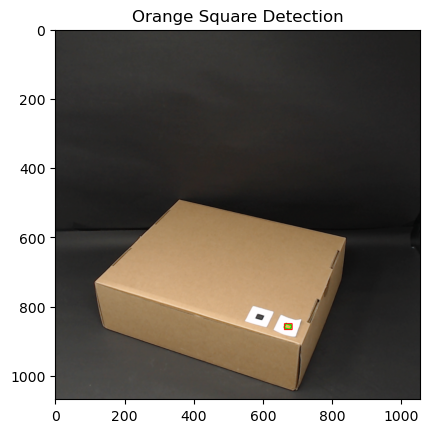

Kantenlänge (Länge): 26.80 cm
Kantenlänge (Höhe): 6.45 cm
Kantenlänge (Tiefe): 17.05 cm


In [300]:
len_1cm_mean_3D = get_Orange_Square_Lenght_3D(prepared_image_rgb_3D)

lenght_cm_3D = length_mean / len_1cm_mean_3D
height_cm_3D = height_mean / len_1cm_mean_3D
depth_cm_3D = depth_mean / len_1cm_mean_3D

# Drucken Sie die Ergebnisse
print(f'Kantenlänge (Länge): {lenght_cm_3D:.2f} cm')
print(f'Kantenlänge (Höhe): {height_cm_3D:.2f} cm')
print(f'Kantenlänge (Tiefe): {depth_cm_3D:.2f} cm')

